# Building Music Recommendation System using Spotify Dataset

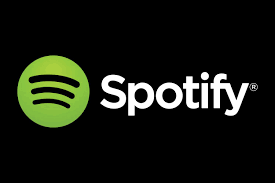

## Introduction

This project aims to develop a Music Recommendation System using the [Spotify Dataset](https://www.kaggle.com/datasets/vatsalmavani/spotify-dataset) from Kaggle. The system will analyze the dataset, perform exploratory data analysis (EDA), select relevant features, and build a recommendation model.

## Steps:

1. **Data Understanding**: Explore the dataset to gain insights into its structure and contents.

2. **Exploratory Data Analysis (EDA)**: Conduct EDA to analyze distributions, correlations, and patterns in the data. This process helps in identifying relevant features for the recommendation system.

3. **Feature Selection**: Select relevant features based on the findings from EDA to build the recommendation system.

4. **Model Development**: Develop the recommendation system using the selected features and appropriate algorithms.

5. **Evaluation and Validation**: Evaluate and validate the system's performance using suitable metrics and techniques.

6. **Conclusion**: Summarize the findings, insights gained, and potential areas for further improvement.




# **Import Libraries**

In [49]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

import pickle

# **Read Data**

In [50]:
data = pd.read_csv("./data/data.csv")
genre_data = pd.read_csv('./data/data_by_genres.csv')
year_data = pd.read_csv('./data/data_by_year.csv')



In [51]:
def search_string_in_name(data, search_str, top_n=20):
    result = data[data['name'].str.contains(search_str)].head(top_n)
    for index, row in result.iterrows():
        print(row.to_dict()['name'])




In [52]:
print(data.info())      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [53]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']


In [54]:
data.shape

(170653, 19)

In [55]:
data['year'].value_counts()

year
2018    2103
2020    2030
2011    2017
2010    2016
2014    2005
        ... 
1925     278
1924     236
1923     185
1921     150
1922      71
Name: count, Length: 100, dtype: int64

In [56]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [57]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


We are going to check for all the analysis with the target as **'popularity'**. Before going to do that let's check for the Feature Correlation by considering a few features

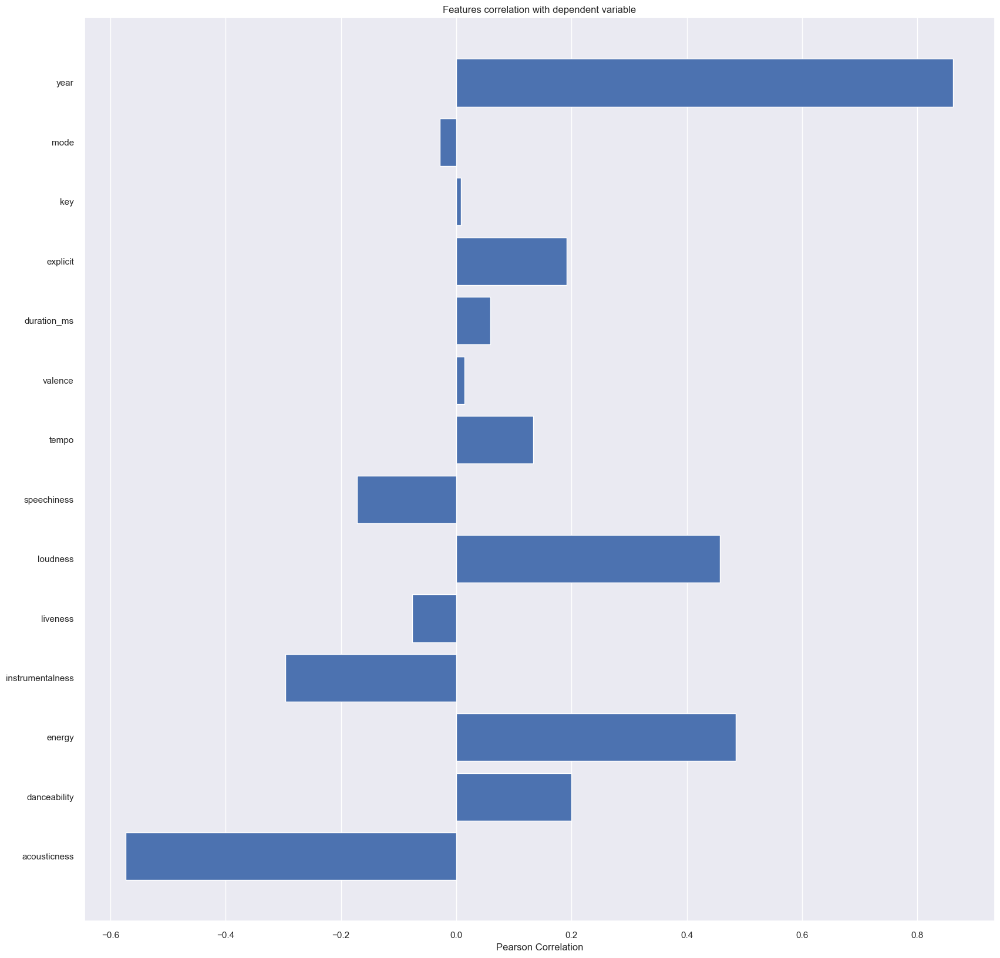

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [58]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

# **Data Understanding by Visualization and EDA**

# **Music Over Time**

Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

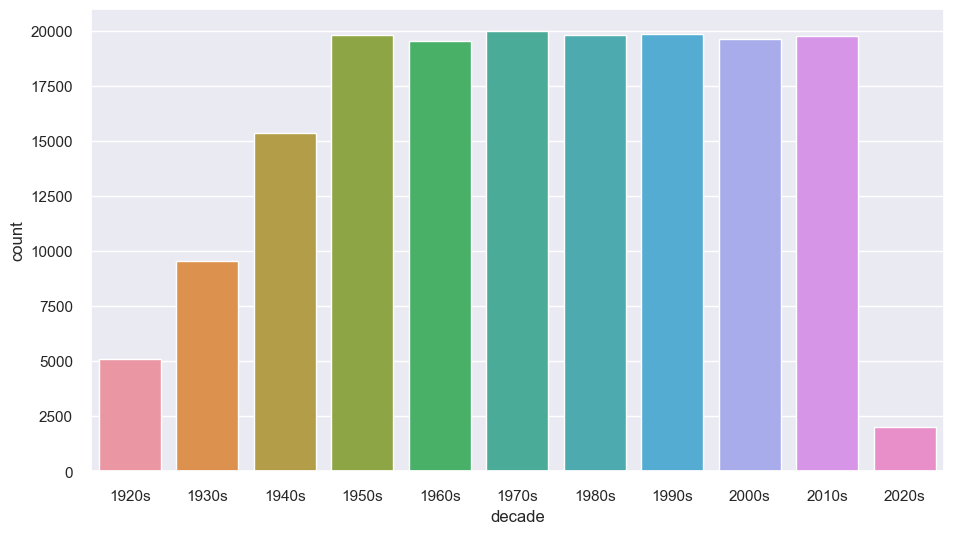

In [59]:
def get_decade(year):
    period_start = int(year / 10) * 10
    decade = '{}s'.format(period_start)
    return decade


data['decade'] = data['year'].apply(get_decade)


sns.set(rc={'figure.figsize':(11 ,6)})

sns.countplot(data=data,x=data['decade'])

plt.show()

In [60]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

# **Characteristics of Different Genres**

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [61]:
top10_genres = genre_data.nlargest(20, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

# **Clustering Genres with K-Means**

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

In [62]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)



In [63]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.008s...
[t-SNE] Computed neighbors for 2973 samples in 0.595s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106079
[t-SNE] KL divergence after 1000 iterations: 1.393718


# **Clustering Songs with K-Means**

In [69]:
# import pickle

song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)

print(number_cols)

song_cluster_pipeline.fit(X)

print(song_cluster_pipeline)

# pickle.dump(song_cluster_pipeline,open('song_cluster_pipeline.pkl','wb'))

song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels


['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo', 'cluster_label']
Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, verbose=False))])


In [65]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

# Building a Music Recommender System

## Introduction

In this project, we aim to develop a Music Recommender System based on the analysis and visualizations conducted on the Spotify dataset. By leveraging insights gained from the data, we will create a system that recommends songs to users based on their listening history and preferences.

## Approach

### 1. Understanding Data Patterns
   - Through analysis and visualizations, we observed that similar genres and types of songs tend to cluster together in the dataset. This insight forms the basis of our recommendation approach.

### 2. Utilizing Spotipy
   - We will use [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/), a Python client for the Spotify Web API, to fetch data and query Spotify’s catalog for songs.
   - Installation: `pip install spotipy`
   
### 3. Creating Spotify Developer App
   - To access the Spotify Web API, you need to create an app on the [Spotify Developer’s page](https://developer.spotify.com/) and obtain a Client ID and secret key.

## Recommendation Process

1. **User Listening History**
   - We start by collecting data on the user's listening history, including songs they have previously listened to and enjoyed.

2. **Data Point Clustering**
   - Using the insights from the dataset analysis, we cluster data points representing songs based on similarity in genres, styles, and other features.

3. **Recommendation Algorithm**
   - By identifying clusters near the data points of songs in the user's listening history, we develop an algorithm to recommend songs from those clusters.

4. **Spotipy Integration**
   - Leveraging Spotipy, we fetch details of recommended songs from the Spotify catalog, including track names, artists, and album information.

## Conclusion

The Music Recommender System aims to enhance the user experience by providing personalized song recommendations tailored to individual preferences. By combining data analysis, machine learning algorithms, and the Spotify Web API, we strive to deliver accurate and relevant recommendations to users.


In [66]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials("1332d405ad36413b81cdb56b9bc9dda4",
                                                           "6ceea3fc05c846c8bc3f25427cb8f11d"))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [67]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:

        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  

    song_matrix = np.array(song_vectors)

    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs(song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

test_song_list = [ {'name': 'Stay Away', 'year': 1993, 
                    'name': 'Come As You Are', 'year': 1991, 
                    'name': 'Smells Like Teen Spirit', 'year': 1991, 
                    'name': 'Lithium', 'year': 1992, 
                    'name': 'Perfect', 'year': 2017 
                    } ]
recommend_songs(test_song_list,  data)

[{'name': 'Jamais Vu', 'year': 2019, 'artists': "['BTS']"},
 {'name': 'Chasing Cars', 'year': 2006, 'artists': "['Snow Patrol']"},
 {'name': 'Shallow - Radio Edit',
  'year': 2018,
  'artists': "['Lady Gaga', 'Bradley Cooper']"},
 {'name': 'Strawberries & Cigarettes',
  'year': 2018,
  'artists': "['Troye Sivan']"},
 {'name': 'Feelings', 'year': 2020, 'artists': "['Lauv']"},
 {'name': 'Panic Room', 'year': 2018, 'artists': "['Au/Ra']"},
 {'name': 'La Playa', 'year': 2000, 'artists': "['La Oreja de Van Gogh']"},
 {'name': 'Naked', 'year': 2017, 'artists': "['James Arthur']"},
 {'name': 'Inevitable', 'year': 1998, 'artists': "['Shakira']"}]

In [68]:
# pickle.dump(data,open('data.pkl','wb'))